<a href="https://colab.research.google.com/github/Chrisolande/Machine-Learning-and-Data-Science-Projects/blob/main/Heart_Disease_Classification_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**About Dataset**

**Context**

This data set dates from 1988 and consists of four databases: Cleveland, Hungary, Switzerland, and Long Beach V. It contains 76 attributes, including the predicted attribute, but all published experiments refer to using a subset of 14 of them. The "target" field refers to the presence of heart disease in the patient. It is integer valued 0 = no disease and 1 = disease.

**Content**

Attribute Information:

1. age
2. sex
3. chest pain type (4 values)
4. resting blood pressure
5. serum cholestoral in mg/dl
6. fasting blood sugar > 120 mg/dl
7. resting electrocardiographic results (values 0,1,2)
8. maximum heart rate achieved
9. exercise induced angina
10. oldpeak = ST depression induced by exercise relative to rest
11. the slope of the peak exercise ST segment
12. number of major vessels (0-3) colored by flourosopy
13. thal: 0 = normal; 1 = fixed defect; 2 = reversable defect
The names and social security numbers of the patients were recently removed from the database, replaced with dummy values.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
from google.colab import files

uploaded = files.upload()

df = pd.read_csv(next(iter(uploaded)))

Saving heart.csv to heart (4).csv


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1025 non-null   int64  
 1   sex       1025 non-null   int64  
 2   cp        1025 non-null   int64  
 3   trestbps  1025 non-null   int64  
 4   chol      1025 non-null   int64  
 5   fbs       1025 non-null   int64  
 6   restecg   1025 non-null   int64  
 7   thalach   1025 non-null   int64  
 8   exang     1025 non-null   int64  
 9   oldpeak   1025 non-null   float64
 10  slope     1025 non-null   int64  
 11  ca        1025 non-null   int64  
 12  thal      1025 non-null   int64  
 13  target    1025 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 112.2 KB


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,1025.0,54.434146,9.072290,29.0,48.0,56.0,61.0,77.0
sex,1025.0,0.695610,0.460373,0.0,0.0,1.0,1.0,1.0
cp,1025.0,0.942439,1.029641,0.0,0.0,1.0,2.0,3.0
trestbps,1025.0,131.611707,17.516718,94.0,120.0,130.0,140.0,200.0
chol,1025.0,246.000000,51.592510,126.0,211.0,240.0,275.0,564.0
fbs,1025.0,0.149268,0.356527,0.0,0.0,0.0,0.0,1.0
restecg,1025.0,0.529756,0.527878,0.0,0.0,1.0,1.0,2.0
thalach,1025.0,149.114146,23.005724,71.0,132.0,152.0,166.0,202.0
exang,1025.0,0.336585,0.472772,0.0,0.0,0.0,1.0,1.0
oldpeak,1025.0,1.071512,1.175053,0.0,0.0,0.8,1.8,6.2


In [5]:
import ydata_profiling as yp

profile_report = yp.ProfileReport(df)

profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (1025, 14)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    14 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 723 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,int64,0.000000,13,29.000000,77.000000,No issue
sex,int64,0.000000,0,0.000000,1.000000,No issue
cp,int64,0.000000,1,0.000000,3.000000,No issue
trestbps,int64,0.000000,16,94.000000,200.000000,has 9 outliers greater than upper bound (170.00) or lower than lower bound(90.00). Cap them or remove them.
chol,int64,0.000000,50,126.000000,564.000000,has 5 outliers greater than upper bound (370.38) or lower than lower bound(115.38). Cap them or remove them.
fbs,int64,0.000000,0,0.000000,1.000000,has 45 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
restecg,int64,0.000000,0,0.000000,2.000000,No issue
thalach,int64,0.000000,30,71.000000,202.000000,has 1 outliers greater than upper bound (215.12) or lower than lower bound(84.12). Cap them or remove them.
exang,int64,0.000000,0,0.000000,1.000000,No issue
oldpeak,float64,0.000000,NA,0.000000,6.200000,has 5 outliers greater than upper bound (4.00) or lower than lower bound(-2.40). Cap them or remove them.


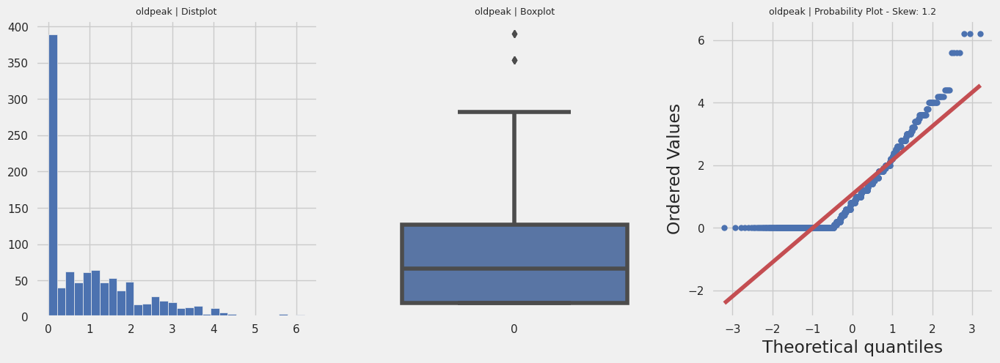

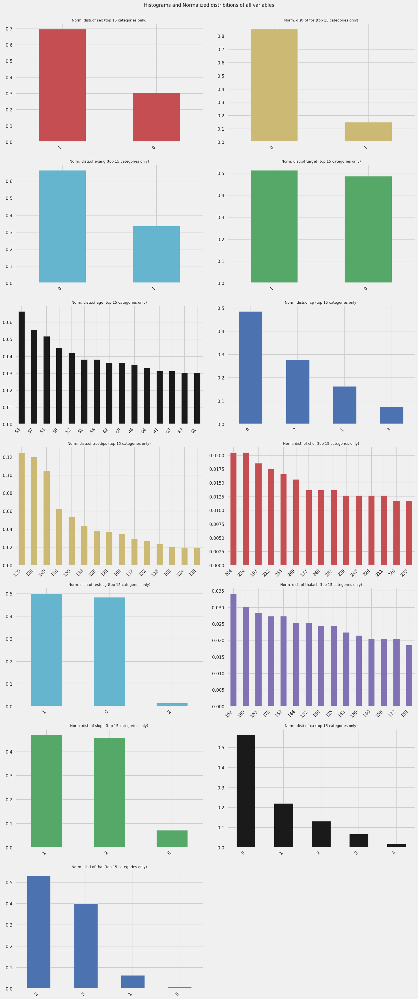

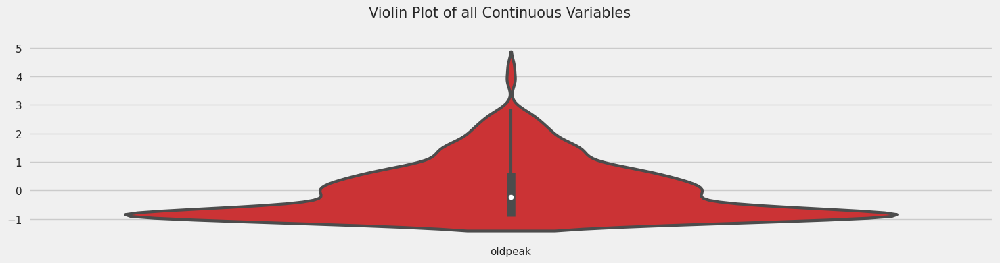

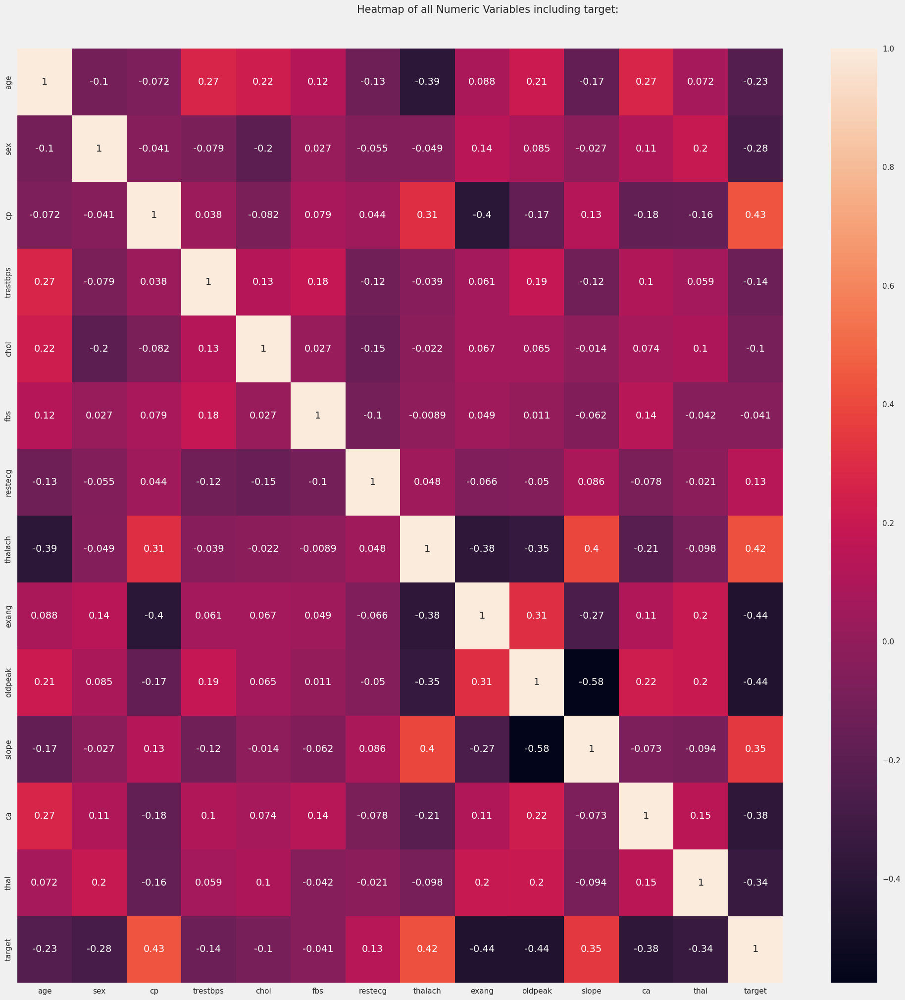

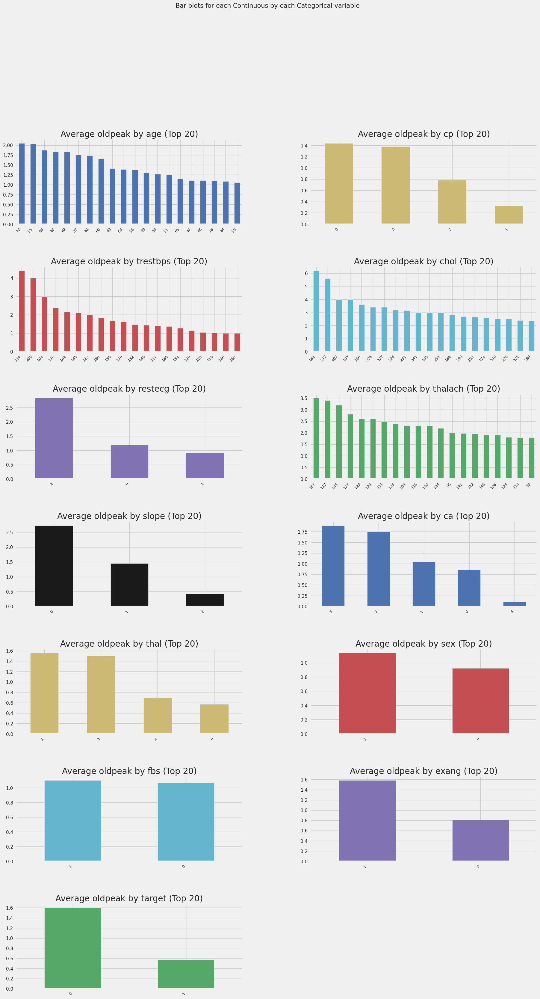

All Plots done
Time to run AutoViz = 13 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [6]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()

dft = AV.AutoViz(
    "",
    sep=",",
    depVar="",
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None,

)

In [7]:
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [8]:
df.tail()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
1020,59,1,1,140,221,0,1,164,1,0.0,2,0,2,1
1021,60,1,0,125,258,0,0,141,1,2.8,1,1,3,0
1022,47,1,0,110,275,0,0,118,1,1.0,1,1,2,0
1023,50,0,0,110,254,0,0,159,0,0.0,2,0,2,1
1024,54,1,0,120,188,0,1,113,0,1.4,1,1,3,0


# Handling Duplicates

In [9]:
df.duplicated().sum()

723

In [10]:
perc_dupl =(( df.duplicated().sum() / df.shape[0]) * 100)

print("There are", df.duplicated().sum(), 'duplicated rows accounting for', perc_dupl, '%')

There are 723 duplicated rows accounting for 70.53658536585365 %


**Observation**

There are 723 duplicated values accounting for 70.5% of the dataset

Since the number is too high, we are not going to drop the duplicated values

# Outliers

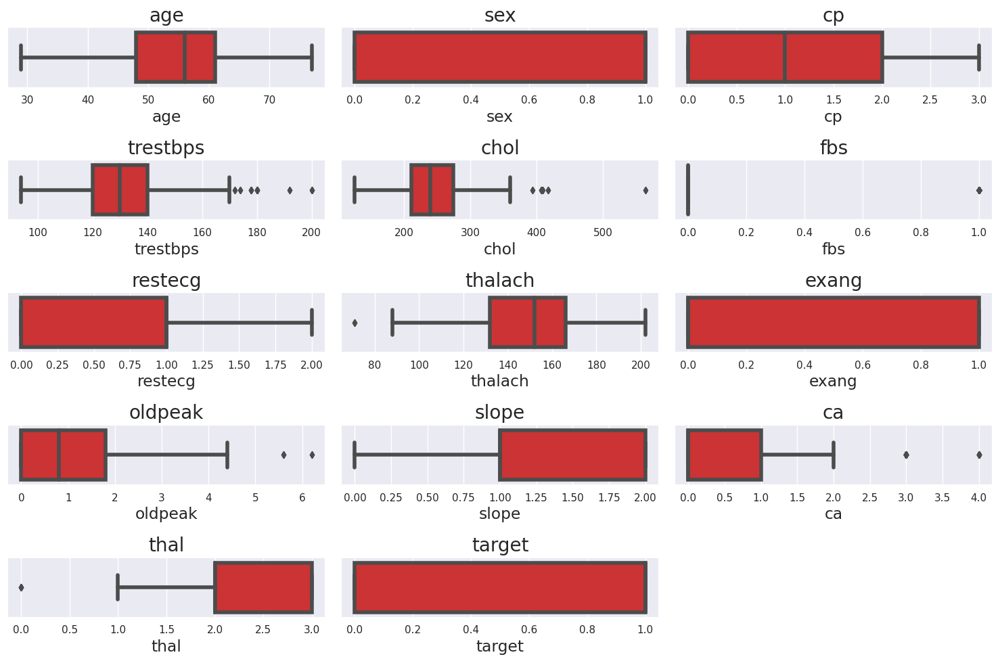

In [11]:
sns.set_style('darkgrid')

features = df.columns.to_list()

num_features = len(features)

num_cols = 3

num_rows = (num_features + num_cols - 1) // num_cols

plt.figure(figsize = (15,10))

for i, feature in enumerate(features):

  plt.subplot(num_rows, num_cols, i+1)

  sns.boxplot(data= df, x= feature)

  plt.title(f"{feature}")

plt.tight_layout()

plt.show()


In [12]:
for feature in features:

  Q1 = df[feature].quantile(0.25)

  Q3 = df[feature].quantile(0.75)

  IQR = Q3 - Q1

  lower_fence = Q1 - 1.5 * IQR

  upper_fence = Q3 + 1.5 * IQR

  lower_outlier_count = df[df[feature] < lower_fence].shape[0]

  upper_outlier_count = df[df[feature] > upper_fence].shape[0]

  total_outliers = lower_outlier_count + upper_outlier_count

  print(f"Feature: {feature}")

  print("Lower Outlier Count: ", lower_outlier_count)

  print("Upper Outlier Count: ", upper_outlier_count)

  print("Total Outliers: ", total_outliers)

  print("-*"*30)

Feature: age
Lower Outlier Count:  0
Upper Outlier Count:  0
Total Outliers:  0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Feature: sex
Lower Outlier Count:  0
Upper Outlier Count:  0
Total Outliers:  0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Feature: cp
Lower Outlier Count:  0
Upper Outlier Count:  0
Total Outliers:  0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Feature: trestbps
Lower Outlier Count:  0
Upper Outlier Count:  30
Total Outliers:  30
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Feature: chol
Lower Outlier Count:  0
Upper Outlier Count:  16
Total Outliers:  16
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Feature: fbs
Lower Outlier Count:  0
Upper Outlier Count:  153
Total Outliers:  153
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Feature: restecg
Lower Outlier Count:  0
Upper Outlier Count:  0
Total Outliers:  0
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-

**Observation**

There are outliers in the data but since it is a medical data we are not going to drop the outliers

# Exploratory Data Analaysis

# Univariate Analysis

In [13]:
df.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

In [14]:
unique_values = pd.DataFrame({'Column': df.columns, 'Unique Values': df.nunique()})

unique_values

,Column,Unique Values
age,age,41
sex,sex,2
cp,cp,4
trestbps,trestbps,49
chol,chol,152
fbs,fbs,2
restecg,restecg,3
thalach,thalach,91
exang,exang,2
oldpeak,oldpeak,40


### Age

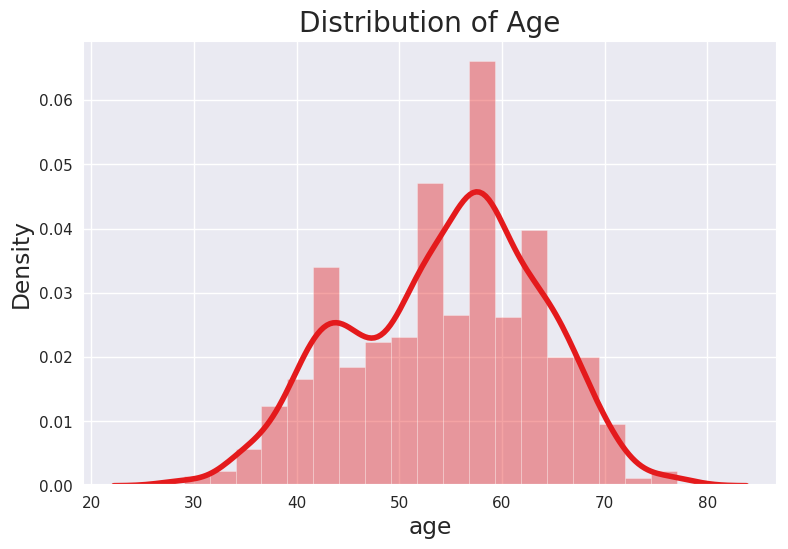

In [15]:
sns.distplot(df['age'], kde= True)

plt.title('Distribution of Age')

plt.show()

### Sex

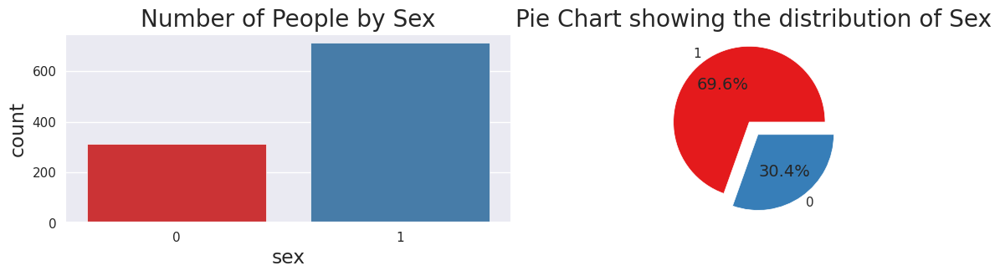

In [16]:
sex_counts = df['sex'].value_counts()

plt.figure(figsize= (12, 6))

plt.subplot(2,2,1)

sns.countplot(data=df, x= 'sex')

plt.title('Number of People by Sex')

plt.subplot(2,2,2)

plt.pie(sex_counts, labels= sex_counts.index, autopct= '%1.1f%%',explode= [0.1, 0.1])

plt.title('Pie Chart showing the distribution of Sex')

plt.tight_layout()

plt.show()


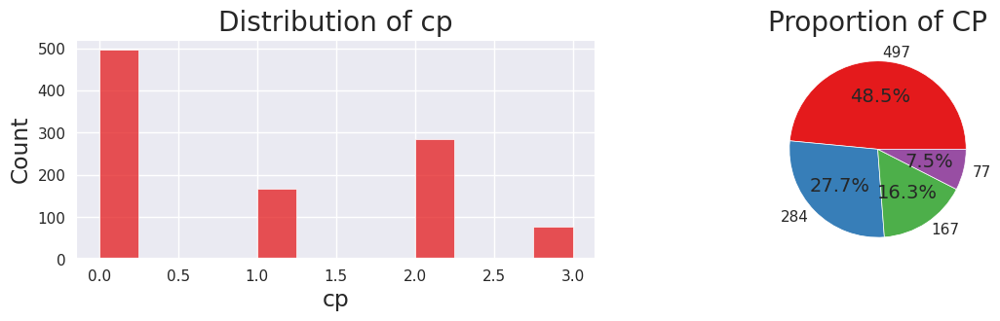

In [17]:
plt.figure(figsize= (12, 6))

plt.subplot(2,2,1)

sns.histplot(data=df, x= 'cp')

plt.title('Distribution of cp')

plt.subplot(2,2,2)

plt.pie(df['cp'].value_counts(), labels= df['cp'].value_counts().unique(), autopct= '%1.1f%%')

plt.title("Proportion of CP")

plt.tight_layout()

plt.show()

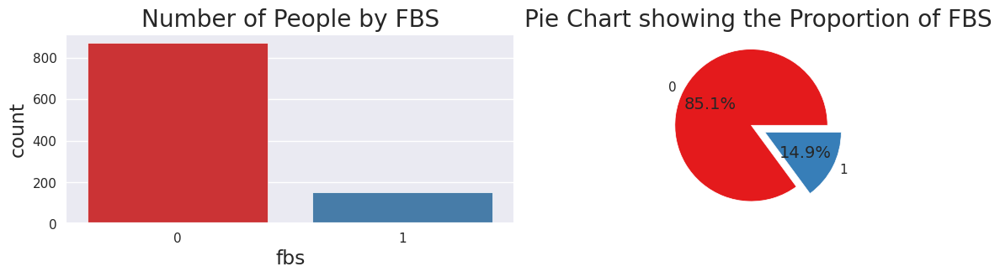

In [18]:
fbs_counts = df['fbs'].value_counts()

plt.figure(figsize= (12, 6))

plt.subplot(2,2,1)

sns.countplot(data=df, x= 'fbs')

plt.title('Number of People by FBS')

plt.subplot(2,2,2)

plt.pie(fbs_counts, labels= fbs_counts.index, autopct= '%1.1f%%',explode= [0.1, 0.1])

plt.title('Pie Chart showing the Proportion of FBS')

plt.tight_layout()

plt.show()

## Bivariate Analysis

In [19]:
df.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

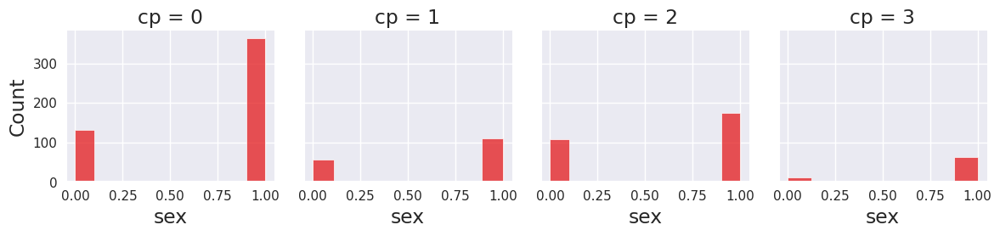

In [20]:
facet_cp = sns.FacetGrid(df, col= 'cp')

facet_cp.map(sns.histplot, 'sex')

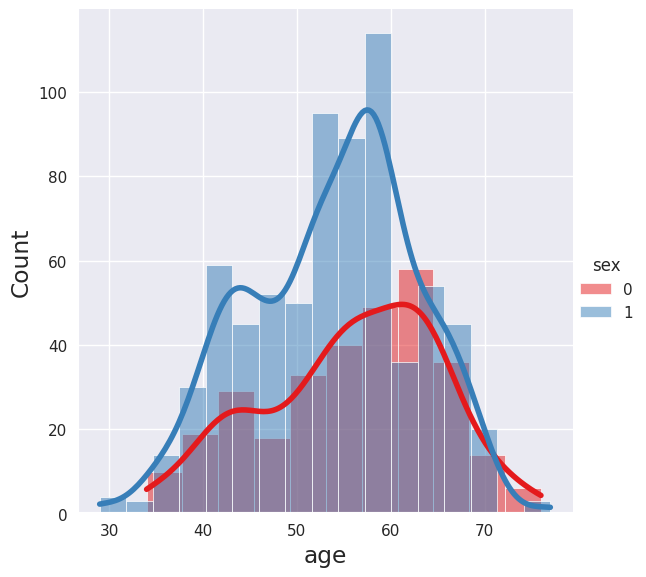

In [21]:
sns.FacetGrid(df, hue= 'sex', height= 6).map(sns.histplot, 'age', kde= True).add_legend()

plt.show()

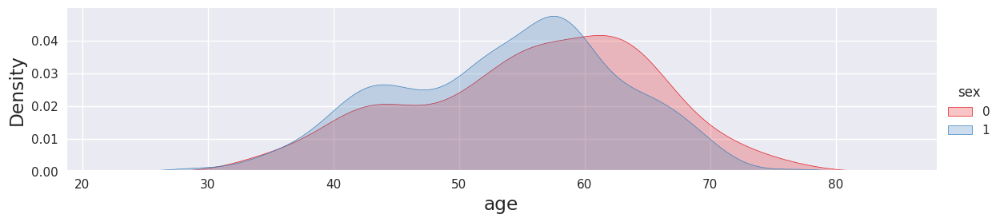

In [22]:
sns.FacetGrid(df, hue= 'sex', aspect= 4).map(sns.kdeplot, 'age',shade= True).add_legend()

plt.show()

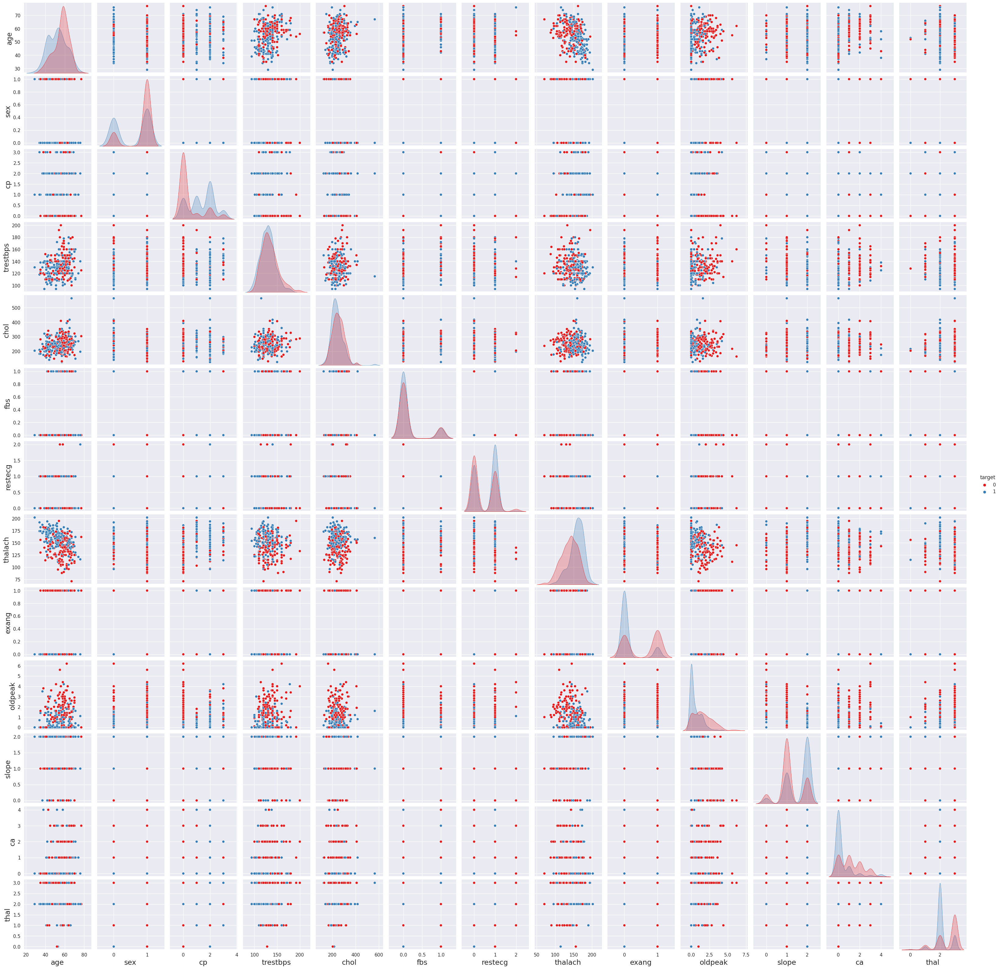

In [23]:
sns.pairplot(data=df, diag_kind= 'kde', hue= 'target')

plt.show()

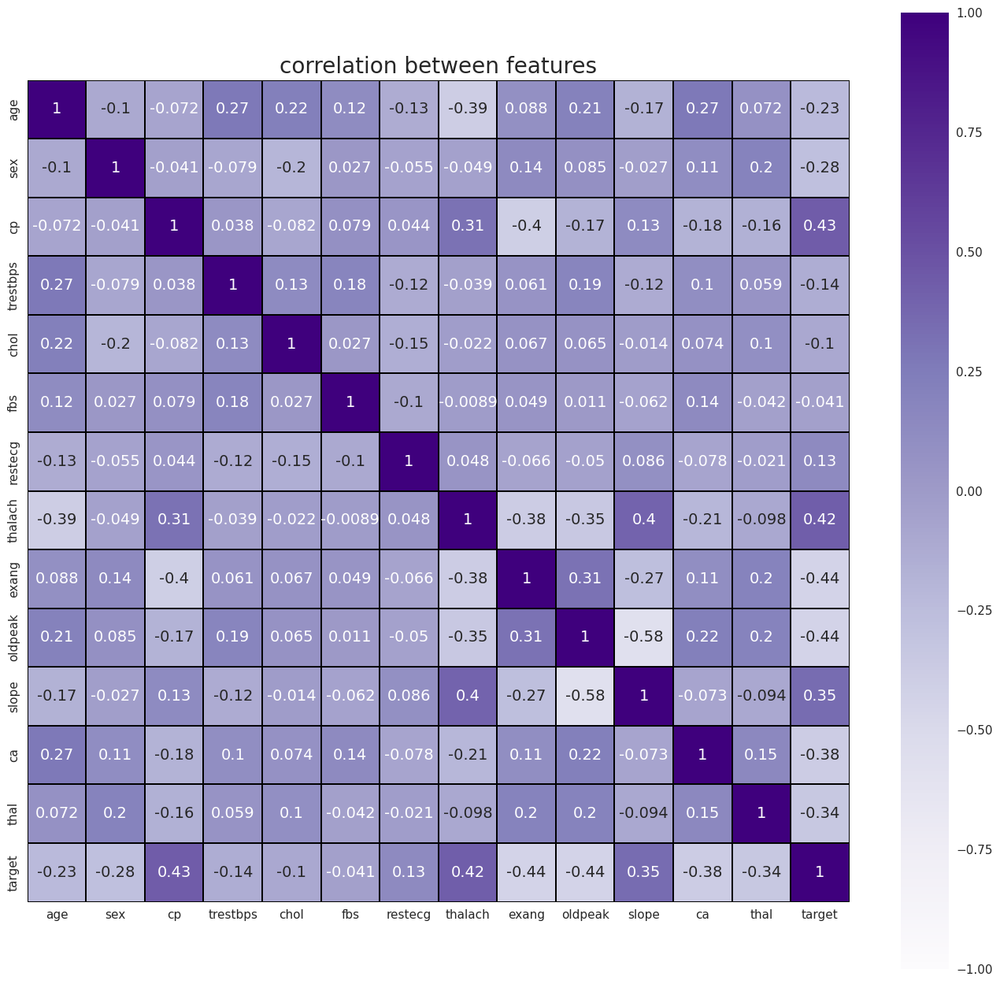

In [48]:
plt.figure(figsize= (15, 15))

sns.heatmap(df.corr(), vmax= 1, vmin= -1, square= True, cmap= 'Purples', linewidths= 0.01, annot= True, linecolor= 'black')

plt.title('correlation between features')

plt.show()

# Data modelling

In [25]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import *

from sklearn.linear_model import LogisticRegression, SGDClassifier

from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier,GradientBoostingClassifier

from sklearn.tree import DecisionTreeClassifier

from sklearn.naive_bayes import GaussianNB, BernoulliNB

from sklearn.neural_network import MLPClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.svm import SVC

import lightgbm as lgb

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X = df.drop(columns= 'target')

y = df['target']


In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, shuffle= True, random_state= 0)

X_train_scaled = scaler.fit_transform(X_train)

X_test_scaled = scaler.transform(X_test)

## Logistic Regression

Logistic Regression Training Set Score:  0.8585365853658536
Logistic Regression Testing Set Score:  0.8634146341463415
Logistic Regression Accuracy Score:  0.8634146341463415
Logistic Regression Classification Report: 
               precision    recall  f1-score   support

           0       0.92      0.79      0.85        98
           1       0.83      0.93      0.88       107

    accuracy                           0.86       205
   macro avg       0.87      0.86      0.86       205
weighted avg       0.87      0.86      0.86       205



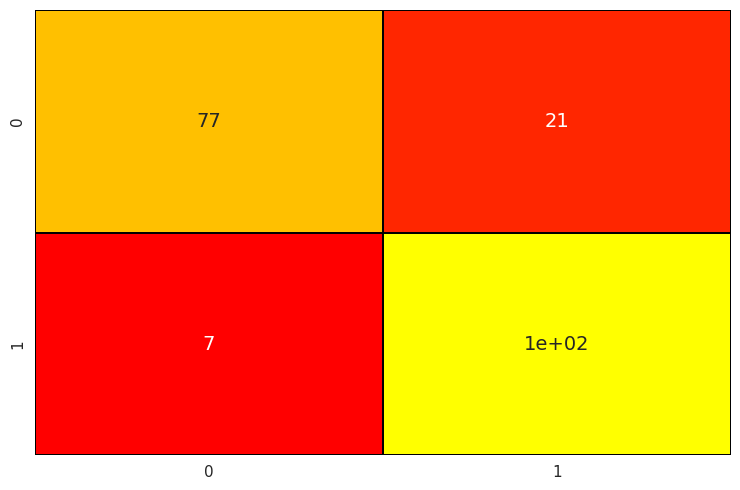

In [27]:
lr = LogisticRegression(solver= 'liblinear')

lr.fit(X_train_scaled, y_train)

lr_ypred_train = lr.predict(X_train_scaled)

lr_ypred_test = lr.predict(X_test_scaled)

print("Logistic Regression Training Set Score: ", lr.score(X_train_scaled, y_train))

print("Logistic Regression Testing Set Score: ", lr.score(X_test_scaled, y_test))

print("Logistic Regression Accuracy Score: ", accuracy_score(y_test, lr_ypred_test))

print("Logistic Regression Classification Report: \n", classification_report(y_test, lr_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= lr_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'autumn', cbar= False)

plt.show()

## Random Forest Classifier

Random Forest Classifier Training Set Score:  1.0
Random Forest Classifier Testing Set Score:  1.0
Random Forest Classifier Accuracy Score:  1.0
Random Forest Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        98
           1       1.00      1.00      1.00       107

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



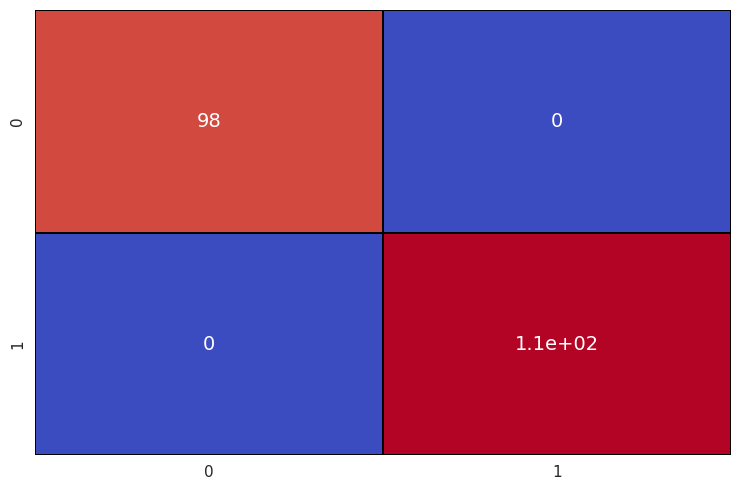

In [28]:
rf = RandomForestClassifier()

rf.fit(X_train_scaled, y_train)

rf_ypred_train = rf.predict(X_train_scaled)

rf_ypred_test = rf.predict(X_test_scaled)

print("Random Forest Classifier Training Set Score: ", rf.score(X_train_scaled, y_train))

print("Random Forest Classifier Testing Set Score: ", rf.score(X_test_scaled, y_test))

print("Random Forest Classifier Accuracy Score: ", accuracy_score(y_test, rf_ypred_test))

print("Random Forest Classifier Classification Report: \n", classification_report(y_test, rf_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= rf_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

### Hyperparameter tuning the Random Forest Classifier using RandomizedSearch CV

In [29]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
param_grid = {

              'max_depth' : [int(y) for y in np.linspace(10, 110, 10)],

              'bootstrap' : [True, False],

              'min_samples_split' : [2,4,5],

              'min_samples_leaf' : [1,3,4],

              'max_features' : ['sqrt', 'log2', None],

              'n_estimators' : [int(x) for x in np.linspace(200, 2000, 10)]
}


rf_rand = RandomizedSearchCV(estimator= rf, param_distributions= param_grid,
                           n_jobs= -1, cv= 5, scoring= 'f1',
                           refit= True)

rf_rand.fit(X_train_scaled, y_train)

print(rf_rand.best_params_)

print(rf_rand.best_score_)

{'n_estimators': 2000, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
0.9879943101241592


### Implementing the randomized hyperparameters



Random Forest Classifier Training Set Score:  1.0
Random Forest Classifier Testing Set Score:  1.0
Random Forest Classifier Accuracy Score:  1.0
Random Forest Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        98
           1       1.00      1.00      1.00       107

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



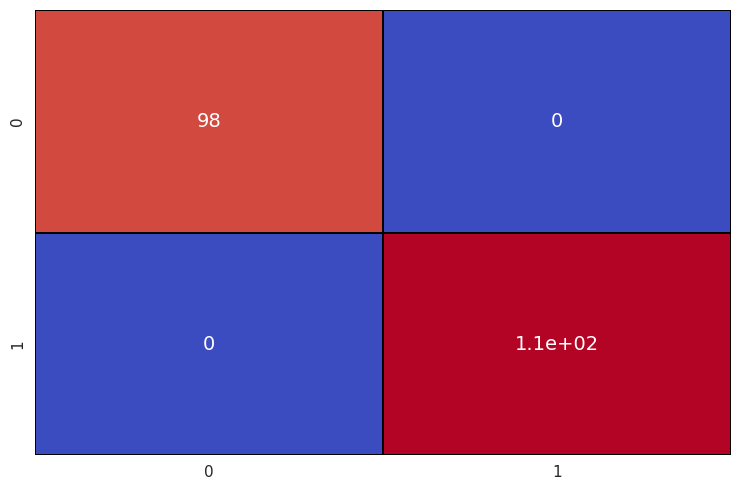

In [47]:
rf_rand = RandomForestClassifier(n_estimators= 2000, min_samples_split= 5, min_samples_leaf = 1,
                                 max_features= 'sqrt', max_depth= 10, bootstrap= True)

rf_rand.fit(X_train_scaled, y_train)

rf_rand_ypred_train = rf_rand.predict(X_train_scaled)

rf_rand_ypred_test = rf_rand.predict(X_test_scaled)

print("Random Forest Classifier Training Set Score: ", rf_rand.score(X_train_scaled, y_train))

print("Random Forest Classifier Testing Set Score: ", rf_rand.score(X_test_scaled, y_test))

print("Random Forest Classifier Accuracy Score: ", accuracy_score(y_test, rf_rand_ypred_test))

print("Random Forest Classifier Classification Report: \n", classification_report(y_test, rf_rand_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= rf_rand_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

the randomly tuned hyperparameters yield a perfect model

## Naive Bayes Classifier

Gaussian Naive Bayes Classifier Training Set Score:  0.8207317073170731
Gaussian Naive Bayes Classifier Testing Set Score:  0.8536585365853658
Gaussian Naive Bayes Classifier Accuracy Score:  0.8536585365853658
Gaussian Naive Bayes Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.88      0.81      0.84        98
           1       0.83      0.90      0.86       107

    accuracy                           0.85       205
   macro avg       0.86      0.85      0.85       205
weighted avg       0.86      0.85      0.85       205



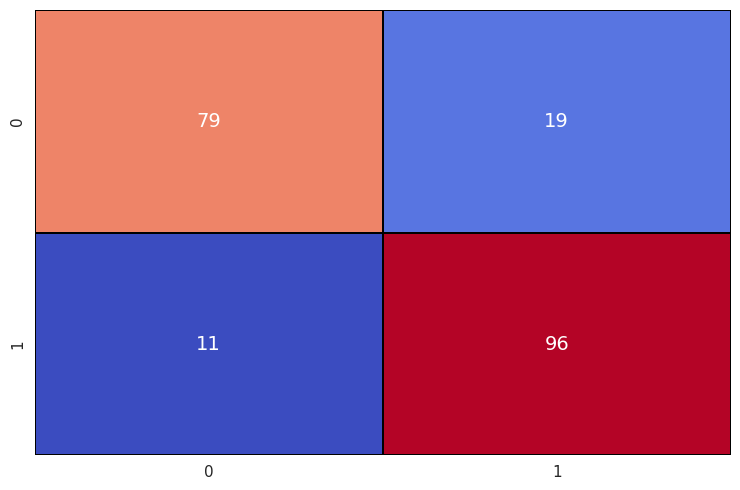

In [31]:
GnB = GaussianNB()

GnB.fit(X_train_scaled, y_train)

GnB_ypred_train = GnB.predict(X_train_scaled)

GnB_ypred_test = GnB.predict(X_test_scaled)

print("Gaussian Naive Bayes Classifier Training Set Score: ", GnB.score(X_train_scaled, y_train))

print("Gaussian Naive Bayes Classifier Testing Set Score: ", GnB.score(X_test_scaled, y_test))

print("Gaussian Naive Bayes Classifier Accuracy Score: ", accuracy_score(y_test, GnB_ypred_test))

print("Gaussian Naive Bayes Classifier Classification Report: \n", classification_report(y_test, GnB_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= GnB_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Bernoulli Naive Bayes Classifier

Bernoulli Naive Bayes Classifier Training Set Score:  0.8341463414634146
Bernoulli Naive Bayes Classifier Testing Set Score:  0.848780487804878
Bernoulli Naive Bayes Classifier Accuracy Score:  0.848780487804878
Bernoulli Naive Bayes Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.84      0.85      0.84        98
           1       0.86      0.85      0.85       107

    accuracy                           0.85       205
   macro avg       0.85      0.85      0.85       205
weighted avg       0.85      0.85      0.85       205



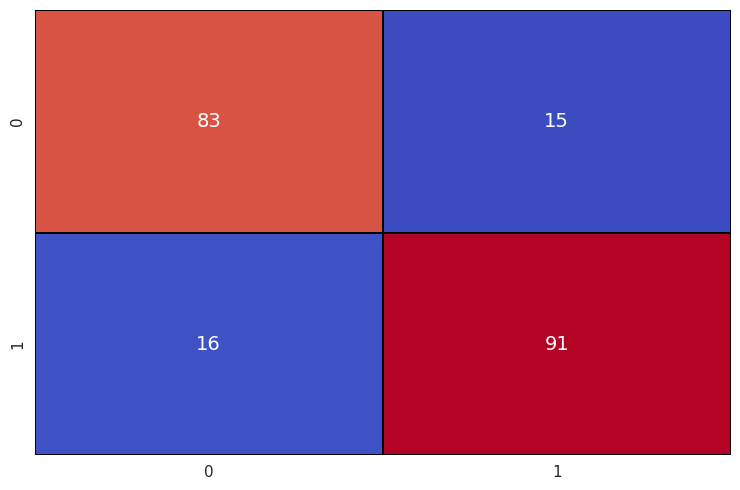

In [32]:
BnB = BernoulliNB()

BnB.fit(X_train_scaled, y_train)

BnB_ypred_train = BnB.predict(X_train_scaled)

BnB_ypred_test = BnB.predict(X_test_scaled)

print("Bernoulli Naive Bayes Classifier Training Set Score: ", BnB.score(X_train_scaled, y_train))

print("Bernoulli Naive Bayes Classifier Testing Set Score: ", BnB.score(X_test_scaled, y_test))

print("Bernoulli Naive Bayes Classifier Accuracy Score: ", accuracy_score(y_test, BnB_ypred_test))

print("Bernoulli Naive Bayes Classifier Classification Report: \n", classification_report(y_test, BnB_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= BnB_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Multi Layer Perceptron

Multi Layer Perceptron Classifier Training Set Score:  0.9792682926829268
Multi Layer Perceptron Classifier Testing Set Score:  0.9804878048780488
Multi Layer Perceptron Classifier Accuracy Score:  0.9804878048780488
Multi Layer Perceptron Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.99      0.97      0.98        98
           1       0.97      0.99      0.98       107

    accuracy                           0.98       205
   macro avg       0.98      0.98      0.98       205
weighted avg       0.98      0.98      0.98       205



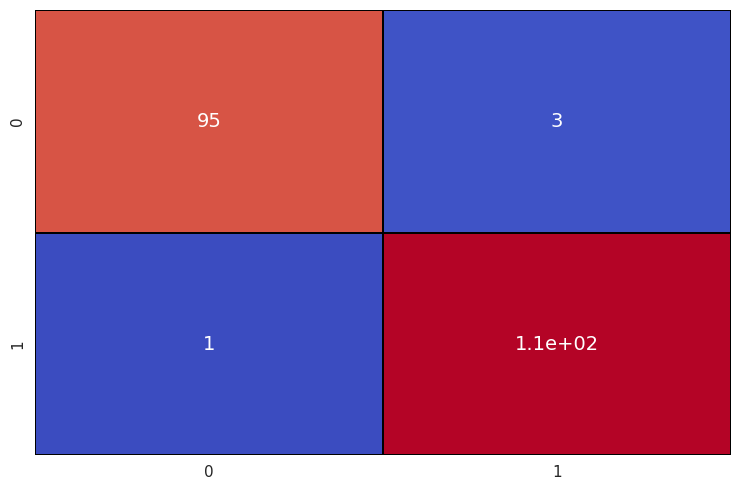

In [33]:
mlp = MLPClassifier()

mlp.fit(X_train_scaled, y_train)

mlp_ypred_train = mlp.predict(X_train_scaled)

mlp_ypred_test = mlp.predict(X_test_scaled)

print("Multi Layer Perceptron Classifier Training Set Score: ", mlp.score(X_train_scaled, y_train))

print("Multi Layer Perceptron Classifier Testing Set Score: ", mlp.score(X_test_scaled, y_test))

print("Multi Layer Perceptron Classifier Accuracy Score: ", accuracy_score(y_test, mlp_ypred_test))

print("Multi Layer Perceptron Classifier Classification Report: \n", classification_report(y_test, mlp_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= mlp_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## K-Nearest Neighbors Classifier

K-Nearest Neighbors Classifier Training Set Score:  0.9585365853658536
K-Nearest Neighbors Classifier Testing Set Score:  0.8829268292682927
K-Nearest Neighbors Classifier Accuracy Score:  0.8829268292682927
K-Nearest Neighbors Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.89      0.86      0.88        98
           1       0.87      0.91      0.89       107

    accuracy                           0.88       205
   macro avg       0.88      0.88      0.88       205
weighted avg       0.88      0.88      0.88       205



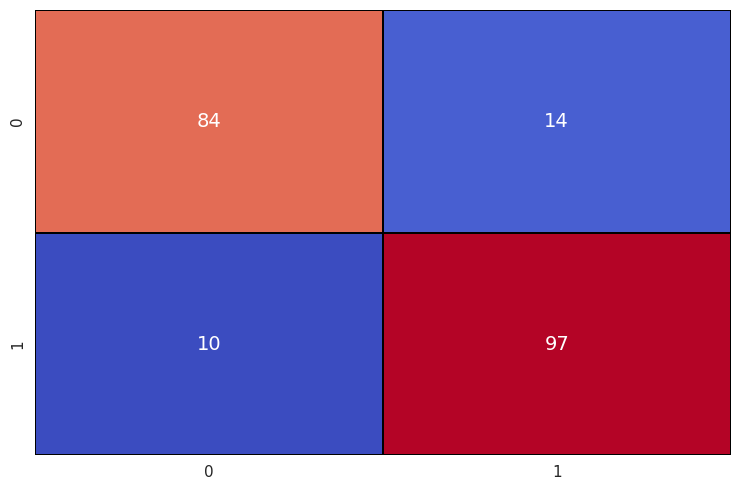

In [34]:
knn = KNeighborsClassifier(n_neighbors= 5)

knn.fit(X_train_scaled, y_train)

knn_ypred_train = knn.predict(X_train_scaled)

knn_ypred_test = knn.predict(X_test_scaled)

print("K-Nearest Neighbors Classifier Training Set Score: ", knn.score(X_train_scaled, y_train))

print("K-Nearest Neighbors Classifier Testing Set Score: ", knn.score(X_test_scaled, y_test))

print("K-Nearest Neighbors Classifier Accuracy Score: ", accuracy_score(y_test, knn_ypred_test))

print("K-Nearest Neighbors Classifier Classification Report: \n", classification_report(y_test, knn_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= knn_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Extra Trees Classifier

Extra Trees Classifier Training Set Score:  1.0
Extra Trees Classifier Testing Set Score:  1.0
Extra Trees Classifier Accuracy Score:  1.0
Extra Trees Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        98
           1       1.00      1.00      1.00       107

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



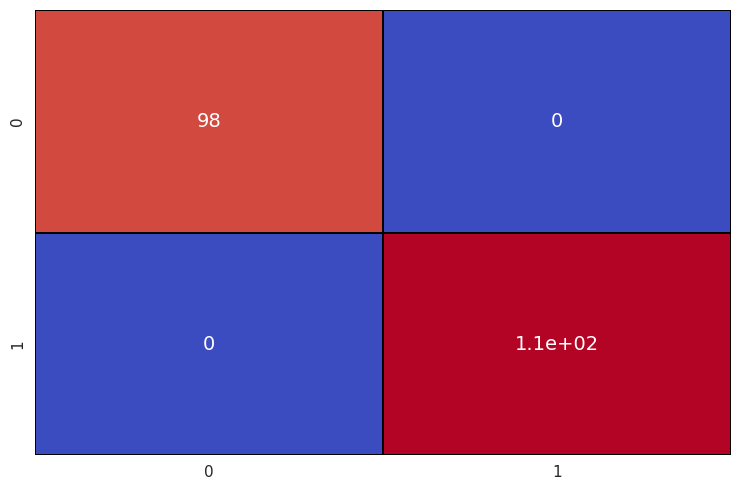

In [35]:
et = ExtraTreesClassifier(n_estimators= 100)

et.fit(X_train_scaled, y_train)

et_ypred_train = et.predict(X_train_scaled)

et_ypred_test = et.predict(X_test_scaled)

print("Extra Trees Classifier Training Set Score: ", et.score(X_train_scaled, y_train))

print("Extra Trees Classifier Testing Set Score: ", et.score(X_test_scaled, y_test))

print("Extra Trees Classifier Accuracy Score: ", accuracy_score(y_test, et_ypred_test))

print("Extra Trees Classifier Classification Report: \n", classification_report(y_test, et_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= et_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Support Vector Classifier

Working on rbf kernel
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Support Vector Classifier rbf kernel Training Set Score:  0.948780487804878
Support Vector Classifier rbf kernel Testing Set Score:  0.9658536585365853
Support Vector Classifier rbf kernel Accuracy Score:  0.9658536585365853
Support Vector Classifier rbf kernel Classification Report: 
               precision    recall  f1-score   support

           0       0.99      0.94      0.96        98
           1       0.95      0.99      0.97       107

    accuracy                           0.97       205
   macro avg       0.97      0.96      0.97       205
weighted avg       0.97      0.97      0.97       205



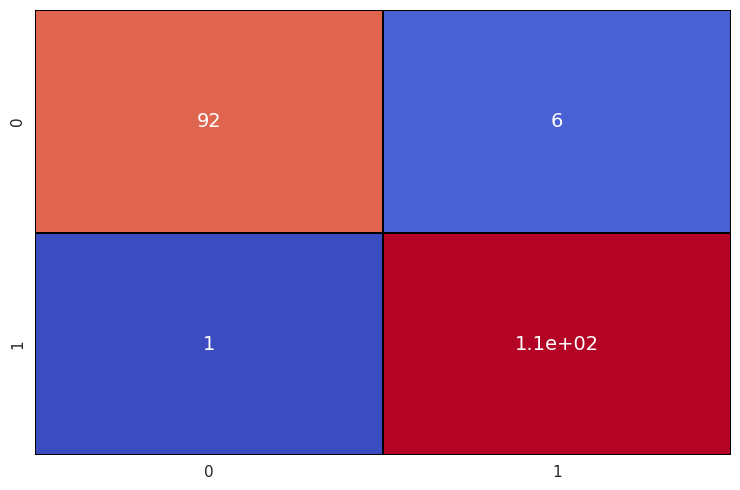

Working on sigmoid kernel
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Support Vector Classifier sigmoid kernel Training Set Score:  0.7475609756097561
Support Vector Classifier sigmoid kernel Testing Set Score:  0.7902439024390244
Support Vector Classifier sigmoid kernel Accuracy Score:  0.7902439024390244
Support Vector Classifier sigmoid kernel Classification Report: 
               precision    recall  f1-score   support

           0       0.82      0.71      0.77        98
           1       0.77      0.86      0.81       107

    accuracy                           0.79       205
   macro avg       0.80      0.79      0.79       205
weighted avg       0.79      0.79      0.79       205



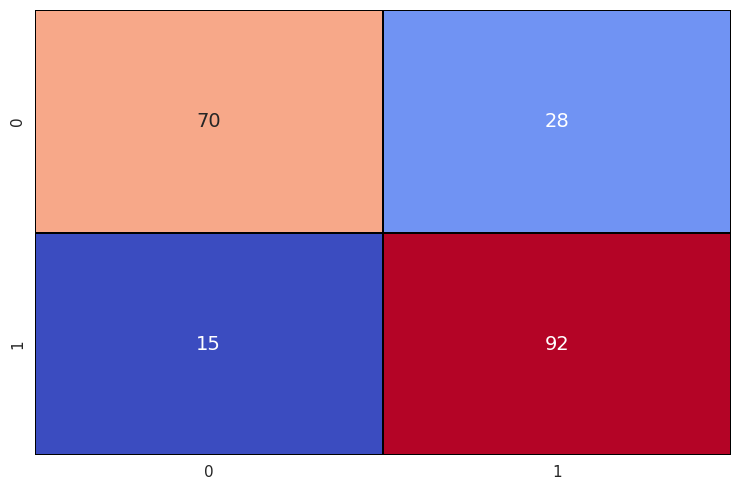

Working on linear kernel
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Support Vector Classifier linear kernel Training Set Score:  0.8280487804878048
Support Vector Classifier linear kernel Testing Set Score:  0.8536585365853658
Support Vector Classifier linear kernel Accuracy Score:  0.8536585365853658
Support Vector Classifier linear kernel Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.76      0.83        98
           1       0.81      0.94      0.87       107

    accuracy                           0.85       205
   macro avg       0.87      0.85      0.85       205
weighted avg       0.86      0.85      0.85       205



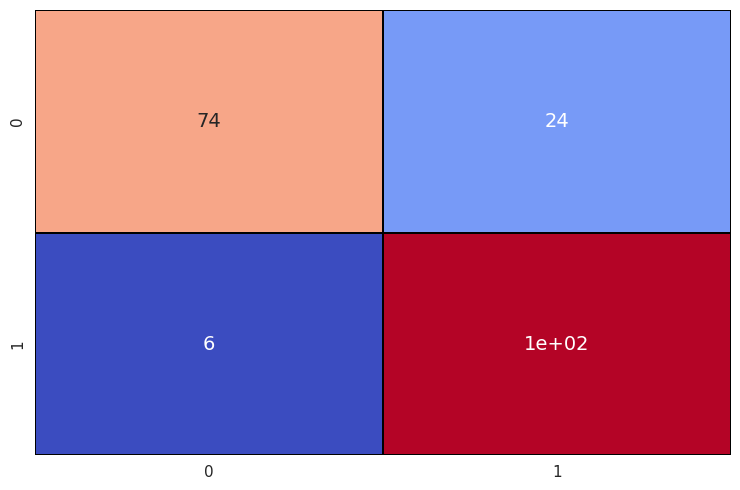

Working on poly kernel
-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
Support Vector Classifier poly kernel Training Set Score:  0.947560975609756
Support Vector Classifier poly kernel Testing Set Score:  0.9707317073170731
Support Vector Classifier poly kernel Accuracy Score:  0.9707317073170731
Support Vector Classifier poly kernel Classification Report: 
               precision    recall  f1-score   support

           0       0.98      0.96      0.97        98
           1       0.96      0.98      0.97       107

    accuracy                           0.97       205
   macro avg       0.97      0.97      0.97       205
weighted avg       0.97      0.97      0.97       205



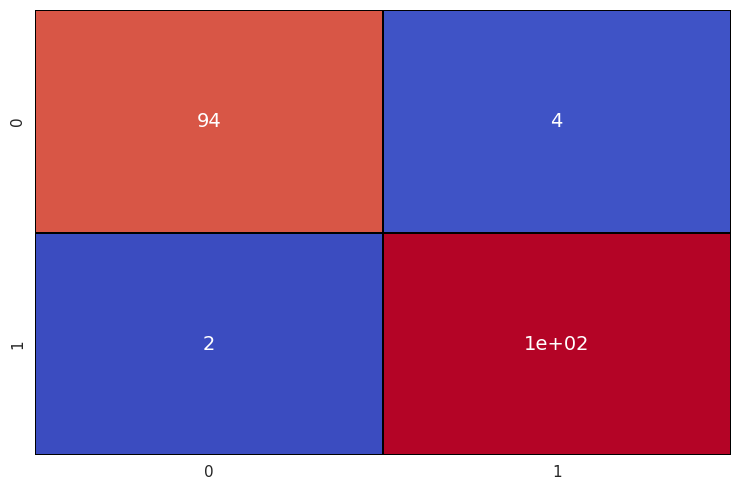

In [36]:
kernels = ['rbf', 'sigmoid', 'linear', 'poly']

for kernel in kernels:

  print(f"Working on {kernel} kernel")

  print("-*"*40)

  svc = SVC(kernel=kernel)

  svc.fit(X_train_scaled, y_train)

  svc_ypred_train = svc.predict(X_train_scaled)

  svc_ypred_test = svc.predict(X_test_scaled)

  print(f"Support Vector Classifier {kernel} kernel Training Set Score: ", svc.score(X_train_scaled, y_train))

  print(f"Support Vector Classifier {kernel} kernel Testing Set Score: ", svc.score(X_test_scaled, y_test))

  print(f"Support Vector Classifier {kernel} kernel Accuracy Score: ", accuracy_score(y_test, svc_ypred_test))

  print(f"Support Vector Classifier {kernel} kernel Classification Report: \n", classification_report(y_test, svc_ypred_test))

  conf_matrix = confusion_matrix(y_true= y_test, y_pred= svc_ypred_test)

  sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

  plt.show()




## Stochastic Gradient Descent

Stochastic Gradient Descent Classifier Training Set Score:  0.8097560975609757
Stochastic Gradient Descent Classifier Testing Set Score:  0.7951219512195122
Stochastic Gradient Descent Classifier Accuracy Score:  0.7951219512195122
Stochastic Gradient Descent Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.80      0.76      0.78        98
           1       0.79      0.83      0.81       107

    accuracy                           0.80       205
   macro avg       0.80      0.79      0.79       205
weighted avg       0.80      0.80      0.79       205



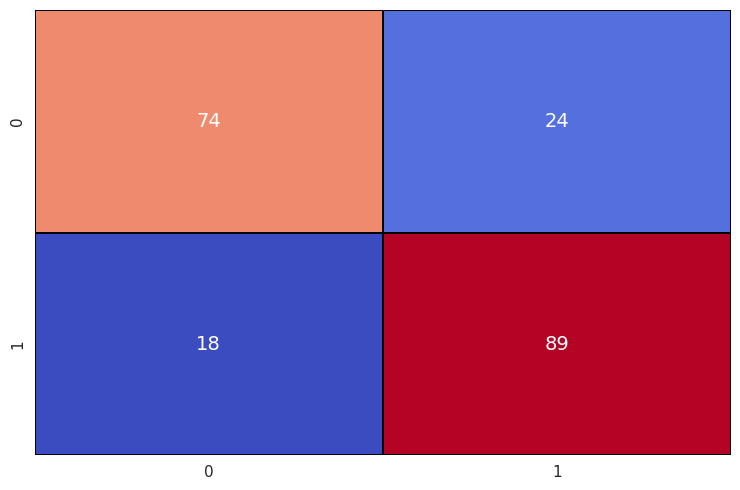

In [37]:
sgd = SGDClassifier(max_iter= 1000, tol= 1e-4)

sgd.fit(X_train_scaled, y_train)

sgd_ypred_train = sgd.predict(X_train_scaled)

sgd_ypred_test = sgd.predict(X_test_scaled)

print("Stochastic Gradient Descent Classifier Training Set Score: ", sgd.score(X_train_scaled, y_train))

print("Stochastic Gradient Descent Classifier Testing Set Score: ", sgd.score(X_test_scaled, y_test))

print("Stochastic Gradient Descent Classifier Accuracy Score: ", accuracy_score(y_test, sgd_ypred_test))

print("Stochastic Gradient Descent Classifier Classification Report: \n", classification_report(y_test, sgd_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= sgd_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## AdaBoost Classifier

AdaBoost Classifier Training Set Score:  0.9341463414634147
AdaBoost Classifier Testing Set Score:  0.8926829268292683
AdaBoost Classifier Accuracy Score:  0.8926829268292683
AdaBoost Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.92      0.85      0.88        98
           1       0.87      0.93      0.90       107

    accuracy                           0.89       205
   macro avg       0.90      0.89      0.89       205
weighted avg       0.89      0.89      0.89       205



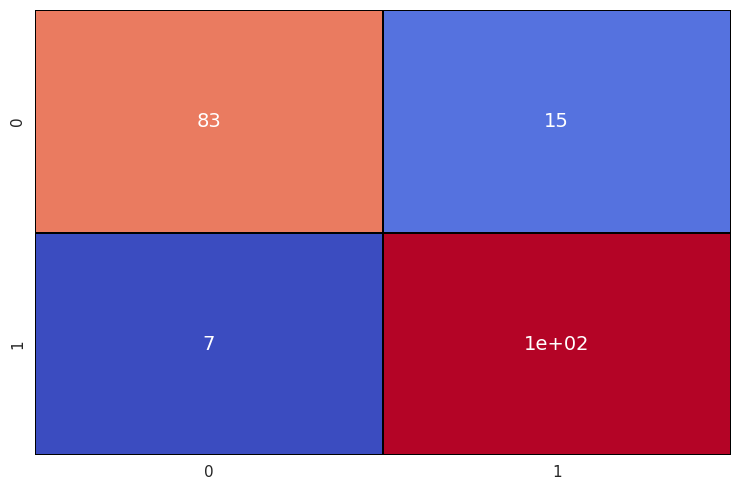

In [38]:
ada = AdaBoostClassifier()

ada.fit(X_train_scaled, y_train)

ada_ypred_train = ada.predict(X_train_scaled)

ada_ypred_test = ada.predict(X_test_scaled)

print("AdaBoost Classifier Training Set Score: ", ada.score(X_train_scaled, y_train))

print("AdaBoost Classifier Testing Set Score: ", ada.score(X_test_scaled, y_test))

print("AdaBoost Classifier Accuracy Score: ", accuracy_score(y_test, ada_ypred_test))

print("AdaBoost Classifier Classification Report: \n", classification_report(y_test, ada_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= ada_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Decision Tree Classifier

Decision Tree Classifier Training Set Score:  1.0
Decision Tree Classifier Testing Set Score:  1.0
Decision Tree Classifier Accuracy Score:  1.0
Decision Tree Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        98
           1       1.00      1.00      1.00       107

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



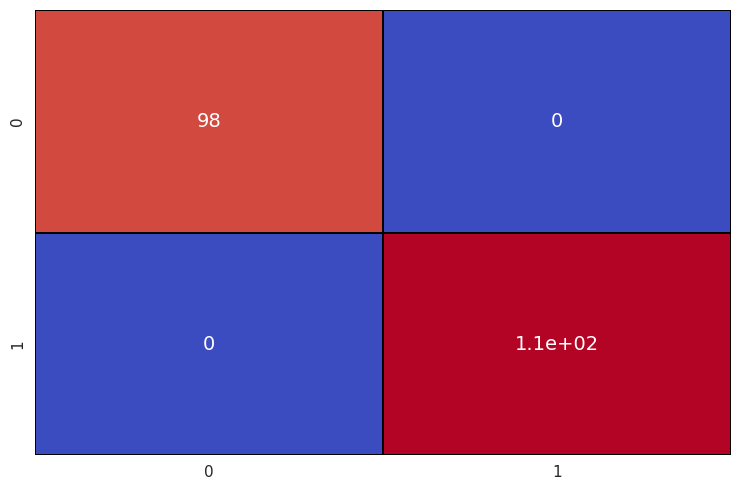

In [39]:
dt = DecisionTreeClassifier()

dt.fit(X_train_scaled, y_train)

dt_ypred_train = dt.predict(X_train_scaled)

dt_ypred_test = dt.predict(X_test_scaled)

print("Decision Tree Classifier Training Set Score: ", dt.score(X_train_scaled, y_train))

print("Decision Tree Classifier Testing Set Score: ", dt.score(X_test_scaled, y_test))

print("Decision Tree Classifier Accuracy Score: ", accuracy_score(y_test, dt_ypred_test))

print("Decision Tree Classifier Classification Report: \n", classification_report(y_test, dt_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= dt_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

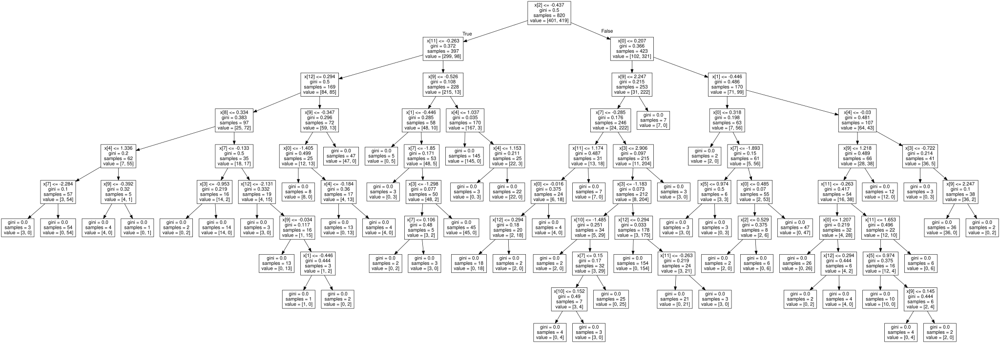

In [40]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(dt, out_file= None)

graph = graphviz.Source(dot_data)

graph

## Gradient Boosting Machine

Gradient Boosting Classifier Training Set Score:  0.9939024390243902
Gradient Boosting Classifier Testing Set Score:  0.9902439024390244
Gradient Boosting Classifier Accuracy Score:  0.9902439024390244
Gradient Boosting Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99        98
           1       0.98      1.00      0.99       107

    accuracy                           0.99       205
   macro avg       0.99      0.99      0.99       205
weighted avg       0.99      0.99      0.99       205



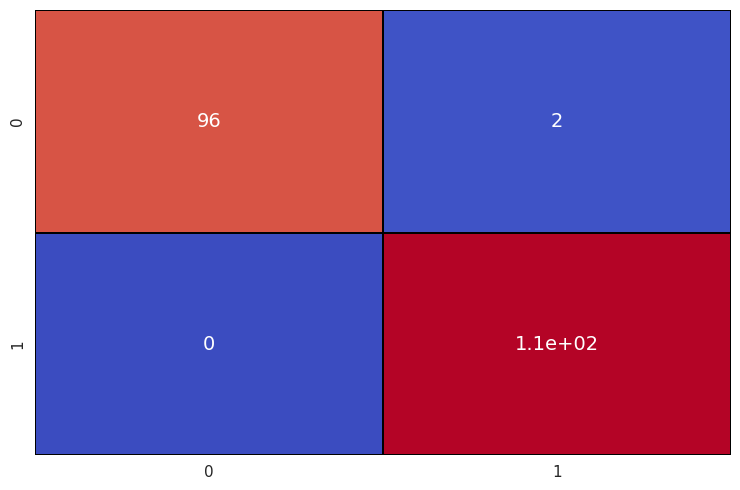

In [41]:
gbm = GradientBoostingClassifier()

gbm.fit(X_train_scaled, y_train)

gbm_ypred_train = gbm.predict(X_train_scaled)

gbm_ypred_test = gbm.predict(X_test_scaled)

print("Gradient Boosting Classifier Training Set Score: ", gbm.score(X_train_scaled, y_train))

print("Gradient Boosting Classifier Testing Set Score: ", gbm.score(X_test_scaled, y_test))

print("Gradient Boosting Classifier Accuracy Score: ", accuracy_score(y_test, gbm_ypred_test))

print("Gradient Boosting Classifier Classification Report: \n", classification_report(y_test, gbm_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= gbm_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Light Gradient Boosting Machine Classifier

Light Gradient Boosting Classifier Training Set Score:  0.9975609756097561
Light Gradient Boosting Classifier Testing Set Score:  0.9902439024390244
Light Gradient Boosting Classifier Accuracy Score:  0.9902439024390244
Light Gradient Boosting Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99        98
           1       0.98      1.00      0.99       107

    accuracy                           0.99       205
   macro avg       0.99      0.99      0.99       205
weighted avg       0.99      0.99      0.99       205



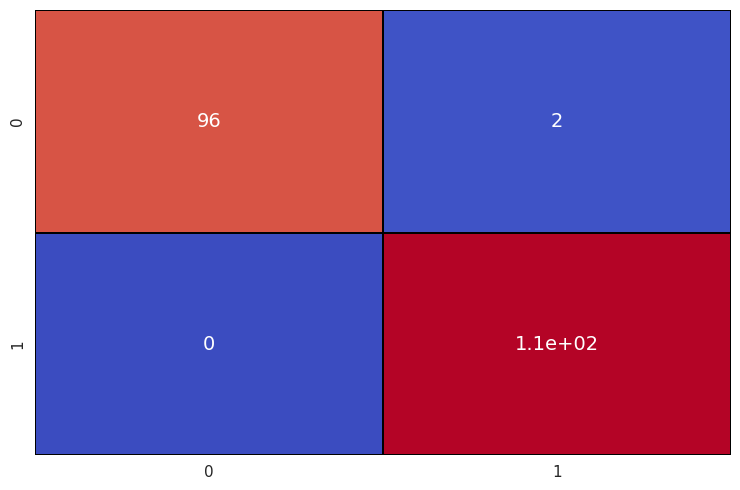

In [42]:
lgb = lgb.LGBMClassifier()

lgb.fit(X_train_scaled, y_train)

lgb_ypred_train = lgb.predict(X_train_scaled)

lgb_ypred_test = lgb.predict(X_test_scaled)

print("Light Gradient Boosting Classifier Training Set Score: ", lgb.score(X_train_scaled, y_train))

print("Light Gradient Boosting Classifier Testing Set Score: ", lgb.score(X_test_scaled, y_test))

print("Light Gradient Boosting Classifier Accuracy Score: ", accuracy_score(y_test, lgb_ypred_test))

print("Light Gradient Boosting Classifier Classification Report: \n", classification_report(y_test, lgb_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= lgb_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Linear Discriminant Analysis

Linear Discriminant Analysis Classifier Training Set Score:  0.8280487804878048
Linear Discriminant Analysis Classifier Testing Set Score:  0.8536585365853658
Linear Discriminant Analysis Classifier Accuracy Score:  0.8536585365853658
Linear Discriminant Analysis Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.76      0.83        98
           1       0.81      0.94      0.87       107

    accuracy                           0.85       205
   macro avg       0.87      0.85      0.85       205
weighted avg       0.86      0.85      0.85       205



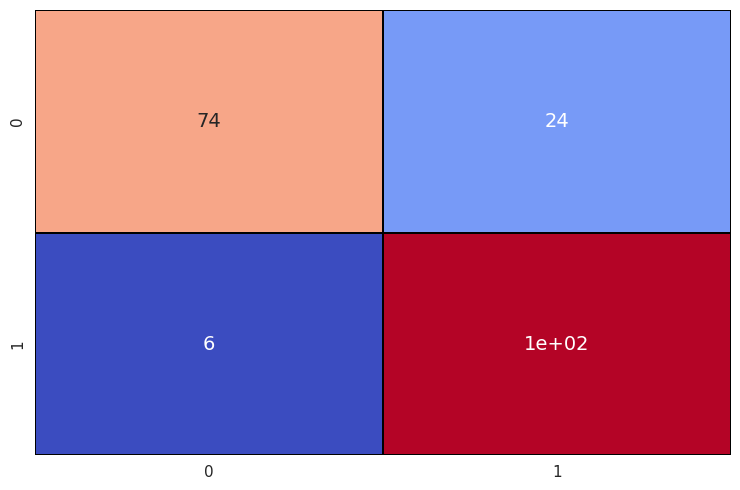

In [43]:
lda = LinearDiscriminantAnalysis()

lda.fit(X_train_scaled, y_train)

lda_ypred_train = lda.predict(X_train_scaled)

lda_ypred_test = lda.predict(X_test_scaled)

print("Linear Discriminant Analysis Classifier Training Set Score: ", lda.score(X_train_scaled, y_train))

print("Linear Discriminant Analysis Classifier Testing Set Score: ", lda.score(X_test_scaled, y_test))

print("Linear Discriminant Analysis Classifier Accuracy Score: ", accuracy_score(y_test, lda_ypred_test))

print("Linear Discriminant Analysis Classifier Classification Report: \n", classification_report(y_test, lda_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= lda_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Quadratic Discriminant Analysis

Quadratic Discriminant Analysis Classifier Training Set Score:  0.8609756097560975
Quadratic Discriminant Analysis Classifier Testing Set Score:  0.8731707317073171
Quadratic Discriminant Analysis Classifier Accuracy Score:  0.8731707317073171
Quadratic Discriminant Analysis Classifier Classification Report: 
               precision    recall  f1-score   support

           0       0.89      0.84      0.86        98
           1       0.86      0.91      0.88       107

    accuracy                           0.87       205
   macro avg       0.87      0.87      0.87       205
weighted avg       0.87      0.87      0.87       205



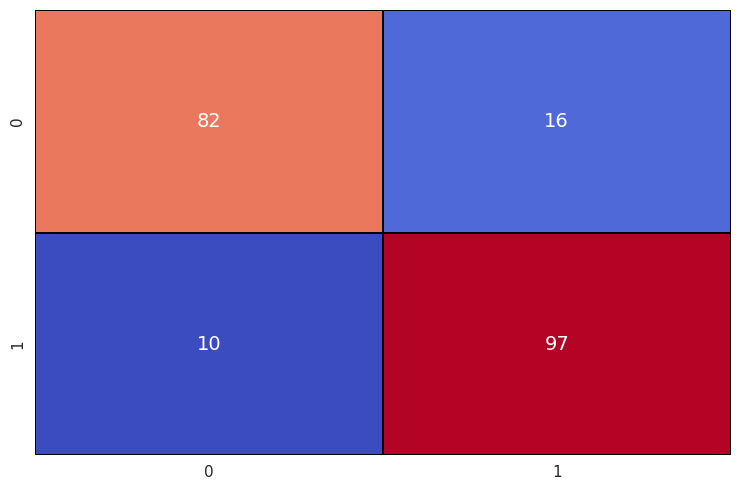

In [44]:
qda = QuadraticDiscriminantAnalysis()

qda.fit(X_train_scaled, y_train)

qda_ypred_train = qda.predict(X_train_scaled)

qda_ypred_test = qda.predict(X_test_scaled)

print("Quadratic Discriminant Analysis Classifier Training Set Score: ", qda.score(X_train_scaled, y_train))

print("Quadratic Discriminant Analysis Classifier Testing Set Score: ", qda.score(X_test_scaled, y_test))

print("Quadratic Discriminant Analysis Classifier Accuracy Score: ", accuracy_score(y_test, qda_ypred_test))

print("Quadratic Discriminant Analysis Classifier Classification Report: \n", classification_report(y_test, qda_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= qda_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()

## Xtreme Gradient Boosting Classifier

Xtreme Gradient Boosting Classifier Training Set Score:  1.0
Xtreme Gradient Boosting Classifier Testing Set Score:  1.0
Xtreme Gradient Boosting Classifier Accuracy Score:  1.0
Xtreme Gradient Boosting Classifier Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        98
           1       1.00      1.00      1.00       107

    accuracy                           1.00       205
   macro avg       1.00      1.00      1.00       205
weighted avg       1.00      1.00      1.00       205



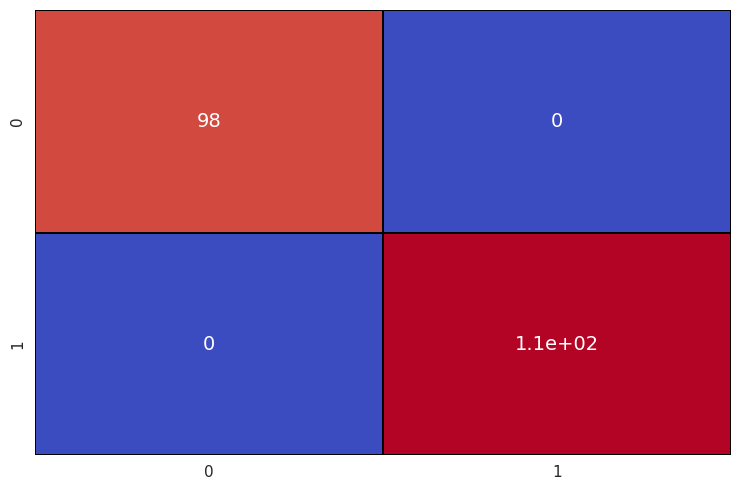

In [45]:
import xgboost as xgb

xgb = xgb.XGBClassifier(n_estimators= 500)

xgb.fit(X_train_scaled, y_train)

xgb_ypred_train = xgb.predict(X_train_scaled)

xgb_ypred_test = xgb.predict(X_test_scaled)

print("Xtreme Gradient Boosting Classifier Training Set Score: ", xgb.score(X_train_scaled, y_train))

print("Xtreme Gradient Boosting Classifier Testing Set Score: ", xgb.score(X_test_scaled, y_test))

print("Xtreme Gradient Boosting Classifier Accuracy Score: ", accuracy_score(y_test, xgb_ypred_test))

print("Xtreme Gradient Boosting Classifier Classification Report: \n", classification_report(y_test, xgb_ypred_test))

conf_matrix = confusion_matrix(y_true= y_test, y_pred= xgb_ypred_test)

sns.heatmap(conf_matrix, annot= True, linewidth= 0.01, linecolor= 'black', cmap= 'coolwarm', cbar= False)

plt.show()